# 0. Import Libraries

In [2]:
# Import necessary libraries for data manipulation, visualization, statistical analysis and machine learning

import pandas as pd
import numpy as np
import pytimetk as tk

from pymc_marketing.mmm.delayed_saturated_mmm import DelayedSaturatedMMM

import arviz as az
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Import Data

In [4]:
# Load the dataset from a CSV file

data = pd.read_csv("../Datasets/MMM_Data.csv", parse_dates=['DATE'])

# Display the first 10 rows to confirm data availability

data.head(10)

,DATE,revenue,tv_S,ooh_S,print_S,social_S,social_I,search_S,search_clicks_P,competitor_sales_B
0,2019-01-07,32107224.25,139668.58,174391.95,119017.64,315063.59,8663567.89,155481.28,45210.44,5824649
1,2019-01-14,43068182.07,158744.22,161767.99,109139.21,341428.00,11908049.77,258595.84,33403.78,8463148
2,2019-01-21,38143441.39,218049.88,87620.89,84148.17,368706.92,10481304.08,168829.71,48598.07,7127538
3,2019-01-28,48320332.58,266857.99,89403.44,112207.31,369401.48,13542435.87,184871.97,36067.24,9318375
4,2019-02-04,33329661.66,258803.10,167667.82,125361.35,322884.41,8808458.61,177182.58,37753.85,8562074
5,2019-02-11,41600972.21,269821.80,192317.25,141782.19,288174.49,11364876.58,195802.23,34462.22,9623549
6,2019-02-18,45752294.18,187610.11,133353.67,58786.90,379546.84,12772748.66,260693.39,17918.94,6900769
7,2019-02-25,46455107.14,194159.54,82650.89,117813.32,396603.03,13069737.22,151727.17,46434.30,3447131
8,2019-03-04,44738465.07,235298.60,166779.46,142439.80,462282.61,12135588.78,161684.94,67421.11,6840968
9,2019-03-11,44370058.47,244372.86,169527.20,114907.03,316555.64,12199441.00,272660.07,30136.68,8276646


# 2. Data Exploration

In [6]:
# Show columns, data types, and nulls to understand the requirements for hygiene activities

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   DATE                300 non-null    datetime64[ns]
 1   revenue             300 non-null    float64       
 2   tv_S                300 non-null    float64       
 3   ooh_S               300 non-null    float64       
 4   print_S             300 non-null    float64       
 5   social_S            300 non-null    float64       
 6   social_I            300 non-null    float64       
 7   search_S            300 non-null    float64       
 8   search_clicks_P     300 non-null    float64       
 9   competitor_sales_B  300 non-null    int64         
dtypes: datetime64[ns](1), float64(8), int64(1)
memory usage: 23.6 KB


In [7]:
# Show descriptive statistics for columns

data.describe()

,DATE,revenue,tv_S,ooh_S,print_S,social_S,social_I,search_S,search_clicks_P,competitor_sales_B
count,300,3.000000e+02,300.000000,300.000000,300.000000,300.000000,3.000000e+02,300.000000,300.000000,3.000000e+02
mean,2021-11-18 12:00:00,3.638064e+07,202076.092300,146300.546900,100536.913567,302202.337833,9.958769e+06,179861.094133,40557.438467,7.032197e+06
min,2019-01-07 00:00:00,2.178890e+07,35736.480000,61738.210000,44221.390000,93388.910000,5.687246e+06,62142.280000,14684.980000,2.094967e+06
25%,2020-06-13 06:00:00,3.157260e+07,166085.690000,120797.662500,85261.455000,239573.907500,8.555798e+06,151610.032500,33723.095000,6.073352e+06
50%,2021-11-18 12:00:00,3.563187e+07,198204.085000,144212.990000,100290.625000,298026.465000,9.780692e+06,175711.375000,39285.520000,7.085002e+06
75%,2023-04-25 18:00:00,4.101267e+07,233498.792500,169881.185000,116396.747500,358179.937500,1.134911e+07,206935.215000,46375.467500,8.097282e+06
max,2024-09-30 00:00:00,5.626729e+07,383832.590000,254406.850000,166972.440000,560163.110000,1.560887e+07,331428.310000,79446.180000,1.181282e+07
std,NaN,6.424026e+06,50776.308812,34783.411579,23149.306333,86290.774734,1.872553e+06,43814.778013,10060.981119,1.468492e+06


In [8]:
# Copy the original data for manipulation

df = data.copy()

# Standardize column names

df.columns = [col.lower() for col in df.columns]

# Show the current list of columns

df.columns.tolist()

['date',
 'revenue',
 'tv_s',
 'ooh_s',
 'print_s',
 'social_s',
 'social_i',
 'search_s',
 'search_clicks_p',
 'competitor_sales_b']

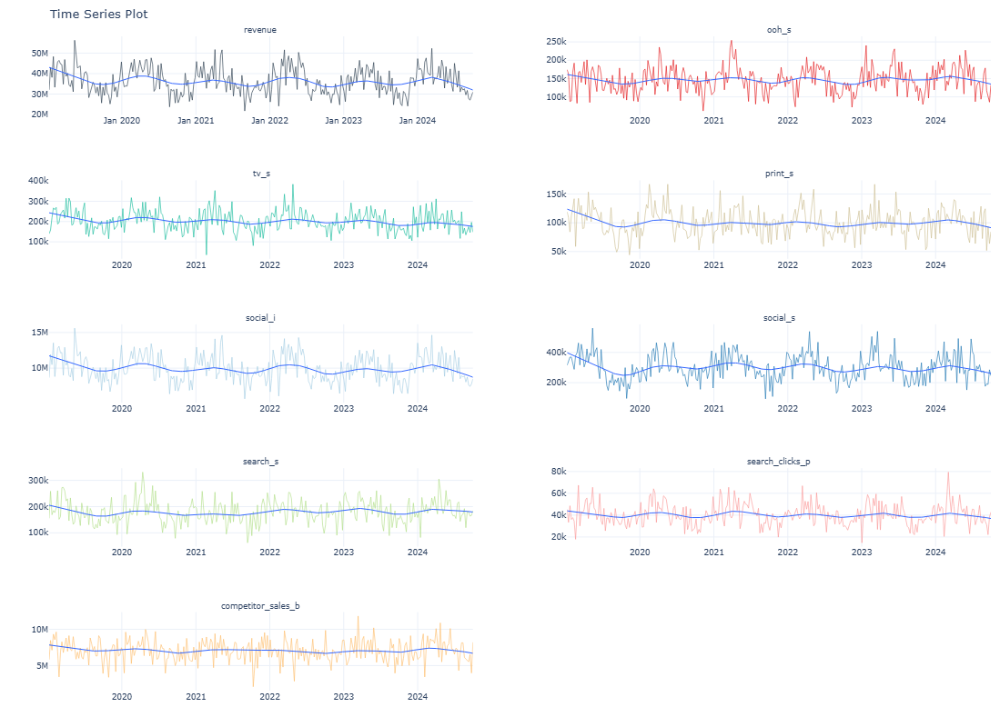

In [9]:
# Visualize Revenue and Spend by channel

df.melt(
        id_vars=["date"], 
        value_vars=["revenue", "ooh_s", "tv_s", "print_s", "social_i", "social_s", "search_s", "search_clicks_p", "competitor_sales_b"]).groupby("variable").plot_timeseries(
        "date", "value", 
        color_column="variable", 
        facet_ncol = 2,
        width = 600,
        height = 800,
        legend_show = False
    )

In [10]:
# Visualize Total Spend, Total Revenue, and Revenue over Ad Spend (ROAS)

total_spend = df[['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']].sum(axis=0).sum()

total_revenue = df['revenue'].sum()

total_revenue / total_spend

39.07791574058526

In [11]:
# Calculate Median and Mean of Monthly Ad Spend

median_spend = df[['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']].median()

mean_spend = df[['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']].mean()

mean_spend

tv_s        202076.092300
ooh_s       146300.546900
print_s     100536.913567
social_s    302202.337833
search_s    179861.094133
dtype: float64

In [12]:
# Show summary statistics, formatted as dollars

df[['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']].describe().apply(lambda x: x.apply(lambda y: "${:,.0f}".format(y)))

,tv_s,ooh_s,print_s,social_s,search_s
count,$300,$300,$300,$300,$300
mean,"$202,076","$146,301","$100,537","$302,202","$179,861"
std,"$50,776","$34,783","$23,149","$86,291","$43,815"
min,"$35,736","$61,738","$44,221","$93,389","$62,142"
25%,"$166,086","$120,798","$85,261","$239,574","$151,610"
50%,"$198,204","$144,213","$100,291","$298,026","$175,711"
75%,"$233,499","$169,881","$116,397","$358,180","$206,935"
max,"$383,833","$254,407","$166,972","$560,163","$331,428"


In [13]:
# Total spend per channel into one sum

total_mean_spend = mean_spend.sum()

# Find the overall average revenue

mean_revenue = df['revenue'].mean()

# Print Total Average Spend and Average Revenue

print(mean_revenue)
print(total_mean_spend.sum())

36380640.16583333
930976.9847333332


# 3. Feature Engineering

In [15]:
# Generate new calendar-based columns from "date" column

df_features = df.assign(
        year = lambda x: x["date"].dt.year,
        month = lambda x: x["date"].dt.month,
        dayofyear = lambda x: x["date"].dt.dayofyear,
    ).assign(
        trend = lambda x: df.index,
    ) 

df_features = df_features[['date', 'revenue', 'tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s', 'trend', 'year', 'month', 'dayofyear']]

# Show new table structure with example rows

df_features.glimpse()

<class 'pandas.core.frame.DataFrame'>: 300 rows of 11 columns
date:       datetime64[ns]    [Timestamp('2019-01-07 00:00:00'), Timesta ...
revenue:    float64           [32107224.25, 43068182.07, 38143441.39, 48 ...
tv_s:       float64           [139668.58, 158744.22, 218049.88, 266857.9 ...
ooh_s:      float64           [174391.95, 161767.99, 87620.89, 89403.44, ...
print_s:    float64           [119017.64, 109139.21, 84148.17, 112207.31 ...
social_s:   float64           [315063.59, 341428.0, 368706.92, 369401.48 ...
search_s:   float64           [155481.28, 258595.84, 168829.71, 184871.9 ...
trend:      int64             [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, ...
year:       int32             [2019, 2019, 2019, 2019, 2019, 2019, 2019, ...
month:      int32             [1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, ...
dayofyear:  int32             [7, 14, 21, 28, 35, 42, 49, 56, 63, 70, 77 ...


# 4. Modeling

In [17]:
# Calculate spend per channel

total_spend_per_channel = df_features[['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']].sum(axis=0)

# Convert totals into proportions of overall spend

spend_proportion = total_spend_per_channel / total_spend_per_channel.sum()

# Compute the scale factor for half-normal prior, based on theory

halfnormal_scale = 1 / np.sqrt(1 - 2 / np.pi)

n_channels = 5

# Build per-channel spread for priors by weighting share of spend

prior_sigma = halfnormal_scale * n_channels * spend_proportion

# Show prior sigma values as a list

prior_sigma.tolist()

[1.8003848443064852,
 1.3034559623286528,
 0.8957276114091688,
 2.692453633462911,
 1.6024616483443126]

In [18]:
# Set the columns (x) and targets (y) for the modeling dataset

X = df_features.drop("revenue",axis=1)
y = df_features["revenue"]

In [19]:
# Create a dummy baseline model with default settings

dummy_model = DelayedSaturatedMMM(
    date_column = "date",
    channel_columns = ['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s'],
    control_columns = [
        "trend",
        "year",
        "month",
    ],
    adstock_max_lag=8,
)

dummy_model.default_model_config

{'intercept': {'dist': 'Normal', 'kwargs': {'mu': 0, 'sigma': 2}},
 'beta_channel': {'dist': 'HalfNormal', 'kwargs': {'sigma': 2}},
 'alpha': {'dist': 'Beta', 'kwargs': {'alpha': 1, 'beta': 3}},
 'lam': {'dist': 'Gamma', 'kwargs': {'alpha': 3, 'beta': 1}},
 'likelihood': {'dist': 'Normal',
  'kwargs': {'sigma': {'dist': 'HalfNormal', 'kwargs': {'sigma': 2}}}},
 'gamma_control': {'dist': 'Normal', 'kwargs': {'mu': 0, 'sigma': 2}},
 'gamma_fourier': {'dist': 'Laplace', 'kwargs': {'mu': 0, 'b': 1}}}

In [20]:
# Customize the model configuration

my_model_config = {
    'intercept': {
        'dist': 'Normal', 
        'kwargs': {
            'mu': 0, 
            'sigma': 2
        }
    },
    'beta_channel': {
        'dist': 'HalfNormal', 
        'kwargs': {
            'sigma': 2
        }
    },
    "likelihood": {
        "dist": "Normal",
        "kwargs":{
            "sigma": {
                'dist': 'HalfNormal', 
                'kwargs': {
                    'sigma': 2
                }
            }
        }
    },
    'alpha': {
        'dist': 'Beta', 
        'kwargs': {'alpha': 1, 'beta': 3}
    },
    'lam': {
        'dist': 'Gamma', 
        'kwargs': {'alpha': 3, 'beta': 1}
    },
    'gamma_control': {
        'dist': 'Normal', 
        'kwargs': {'mu': 0, 'sigma': 2}
    },
    'gamma_fourier': {
        'dist': 'Laplace', 
        'kwargs': {'mu': 0, 'b': 1}
    },
}


In [21]:
# Show progress bar and run model using 2 cores

my_sampler_config= {
    "progressbar": True,
    "cores": 2,
}

In [22]:
# Build the MMM model with custom settings previously configured

mmm = DelayedSaturatedMMM(
    model_config = my_model_config,
    sampler_config = my_sampler_config,
    date_column = "date",
    channel_columns = ['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s'],
    control_columns = [
        "trend",
        "year",
        "month",
    ],
    adstock_max_lag=8,
    yearly_seasonality=2,
)

In [23]:
# Inspect our model's custom configuration and compare to the default settings

mmm.model_config

mmm.default_model_config

{'intercept': {'dist': 'Normal', 'kwargs': {'mu': 0, 'sigma': 2}},
 'beta_channel': {'dist': 'HalfNormal', 'kwargs': {'sigma': 2}},
 'alpha': {'dist': 'Beta', 'kwargs': {'alpha': 1, 'beta': 3}},
 'lam': {'dist': 'Gamma', 'kwargs': {'alpha': 3, 'beta': 1}},
 'likelihood': {'dist': 'Normal',
  'kwargs': {'sigma': {'dist': 'HalfNormal', 'kwargs': {'sigma': 2}}}},
 'gamma_control': {'dist': 'Normal', 'kwargs': {'mu': 0, 'sigma': 2}},
 'gamma_fourier': {'dist': 'Laplace', 'kwargs': {'mu': 0, 'b': 1}}}

In [24]:
# Fit the MMM model and run

mmm.fit(X,y, target_accept = 0.95, random_seed = 42)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [intercept, beta_channel, alpha, lam, gamma_control, gamma_fourier, likelihood_sigma]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 1962 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data
	> constant_data
	> fit_data

# 5. Post-Model Analysis

In [111]:
# Summarize beta coefficients per channel, based on the model's inference data, within 95% confidence intervals

beta_summary = az.summary(
    mmm.idata,
    var_names=["beta_channel"],
    hdi_prob=0.95
)[["mean", "hdi_2.5%", "hdi_97.5%"]].rename(columns={
    "mean": "median",
    "hdi_2.5%": "lower_95",
    "hdi_97.5%": "upper_95"
})

# Convert to a DataFrame indexed by channel

beta_summary.index.name = "channel"
beta_summary = beta_summary.reset_index()

# Display beta coefficients by channel

print(beta_summary)


                  channel  median  lower_95  upper_95
0      beta_channel[tv_s]   0.209     0.003     0.588
1     beta_channel[ooh_s]   0.109     0.000     0.291
2   beta_channel[print_s]   0.159     0.000     0.476
3  beta_channel[social_s]   0.183     0.004     0.454
4  beta_channel[search_s]   0.106     0.000     0.292


In [117]:
# Summarize the adstock decay parameter 'alpha' by channel from the posterior

alpha_summary = az.summary(
    mmm.idata,
    var_names=["alpha"],
    hdi_prob=0.95
)[["mean", "hdi_2.5%", "hdi_97.5%"]].rename(columns={
    "mean": "median_alpha",
    "hdi_2.5%": "alpha_lower95",
    "hdi_97.5%": "alpha_upper95"
})
alpha_summary.index.name = "channel"
alpha_summary = alpha_summary.reset_index()
print("Adstock Decay (alpha) per Channel:\n", alpha_summary, "\n")

Adstock Decay (alpha) per Channel:
            channel  median_alpha  alpha_lower95  alpha_upper95
0      alpha[tv_s]         0.219          0.000          0.531
1     alpha[ooh_s]         0.224          0.001          0.599
2   alpha[print_s]         0.307          0.001          0.650
3  alpha[social_s]         0.280          0.001          0.613
4  alpha[search_s]         0.253          0.001          0.605 



### Model Visualization

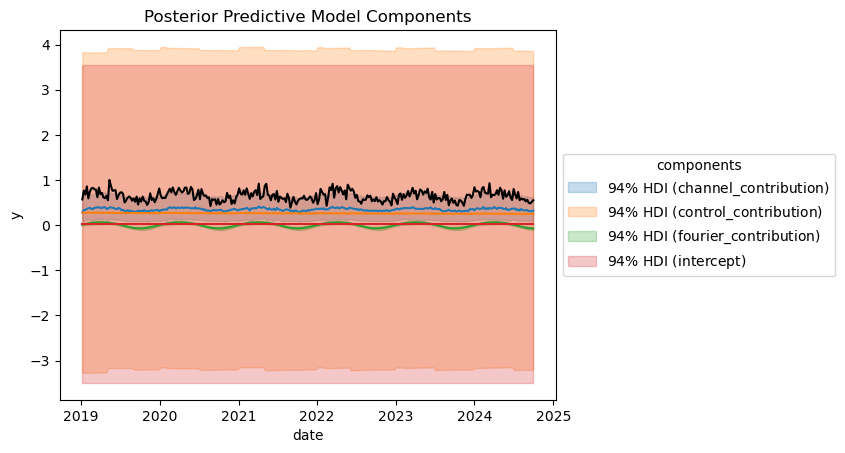

In [27]:
# Plot how model components contribute to revenue over time

fig = mmm.plot_components_contributions()

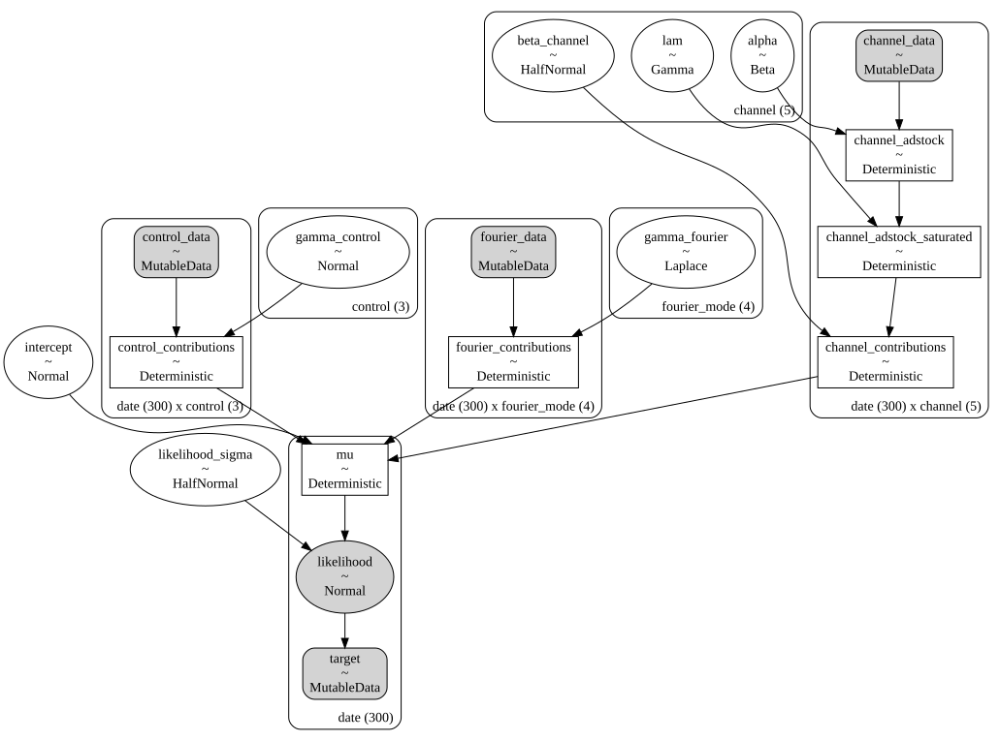

In [28]:
# Show the model's structure as a diagram

fig = mmm.graphviz()
fig

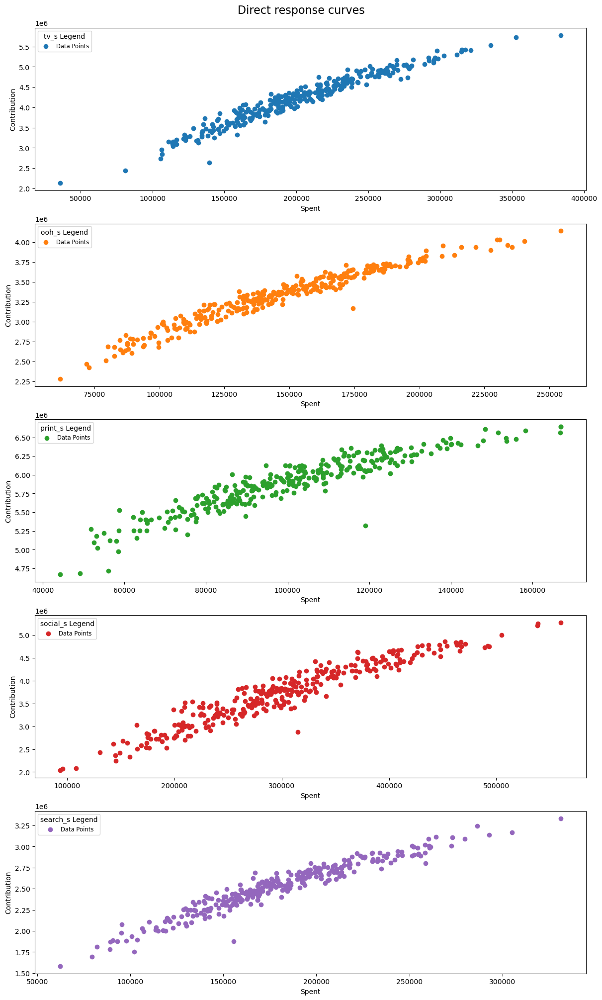

In [29]:
# Plot each channel's Direct Contribution Curve

fig = mmm.plot_direct_contribution_curves()

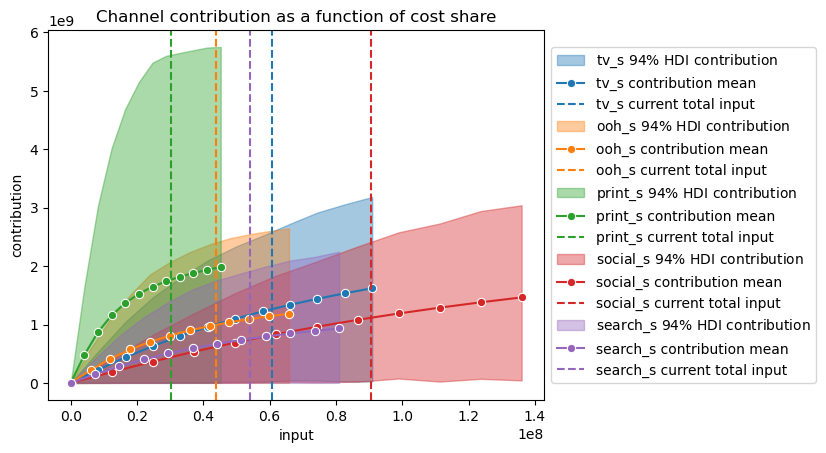

In [30]:
# Plot Channel Contributions with a Spending Range

fig = mmm.plot_channel_contributions_grid(start=0, stop=1.5, num=12, absolute_xrange=True);

### Business Application

In [32]:
# Compute each channel's average revenue contribution over time

get_mean_contributions_over_time_df = mmm.compute_mean_contributions_over_time(original_scale=True)

In [33]:
# Get the full matrix of each channel's contribution for each date

channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

In [34]:
# Calculate ROAS for each channel

roas_samples = (
    channel_contribution_original_scale.stack(sample=("chain", "draw")).sum("date")
    / X[['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']].sum().to_numpy()[..., None]
)

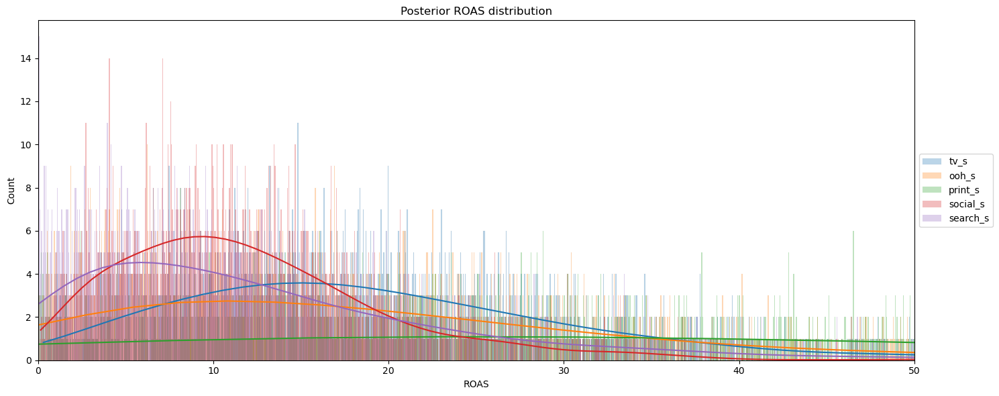

In [35]:
# Visualize Estimated ROAS by Channel

fig, ax = plt.subplots(figsize=(15, 6))
for channel in ['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']:
    sns.histplot(
        roas_samples.sel(channel=channel).to_numpy(), binwidth=0.05, alpha=0.3, kde=True, ax=ax, legend=True, label = channel
    )
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_xlim(0, 50)
ax.set(title="Posterior ROAS distribution", xlabel="ROAS")
plt.tight_layout()
plt.show()


In [36]:
# Create a ROAS Summary table to show the mean and percentiles, within 95% confidence, for each channel

roas_df = roas_samples.to_dataframe(name="roas")

roas_df.groupby("channel").mean()
roas_df.groupby("channel")['roas'].describe(percentiles=[0.025, 0.975])

,count,mean,std,min,2.5%,50%,97.5%,max
channel,,,,,,,,
ooh_s,2000.0,22.675755,31.889875,0.037843,0.878261,15.899637,86.338994,535.474512
print_s,2000.0,58.606759,102.898204,0.042393,1.352396,31.974225,280.320976,1527.397973
search_s,2000.0,14.025262,14.936079,0.018968,0.404328,10.298665,49.863973,144.679472
social_s,2000.0,12.320468,8.641933,0.137020,1.408920,10.856771,32.469038,116.534187
tv_s,2000.0,20.825210,16.207345,0.290896,2.526584,17.890807,57.381833,226.721988


### Budget Allocation

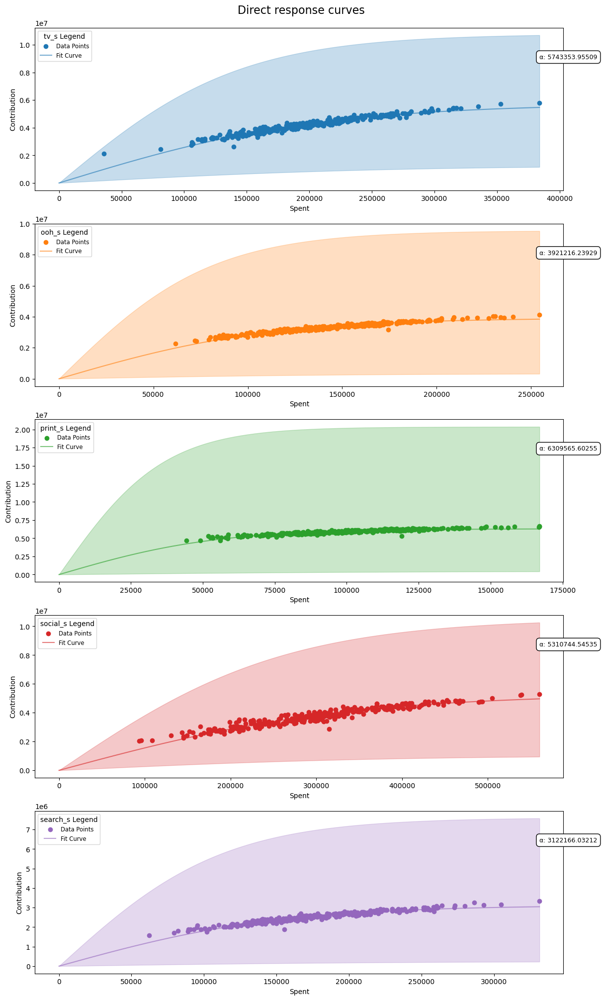

In [38]:
# Plot Response Curves for each channel, based on Sigmoid method

sigmoid_response_curve_fig = mmm.plot_direct_contribution_curves(show_fit=True)

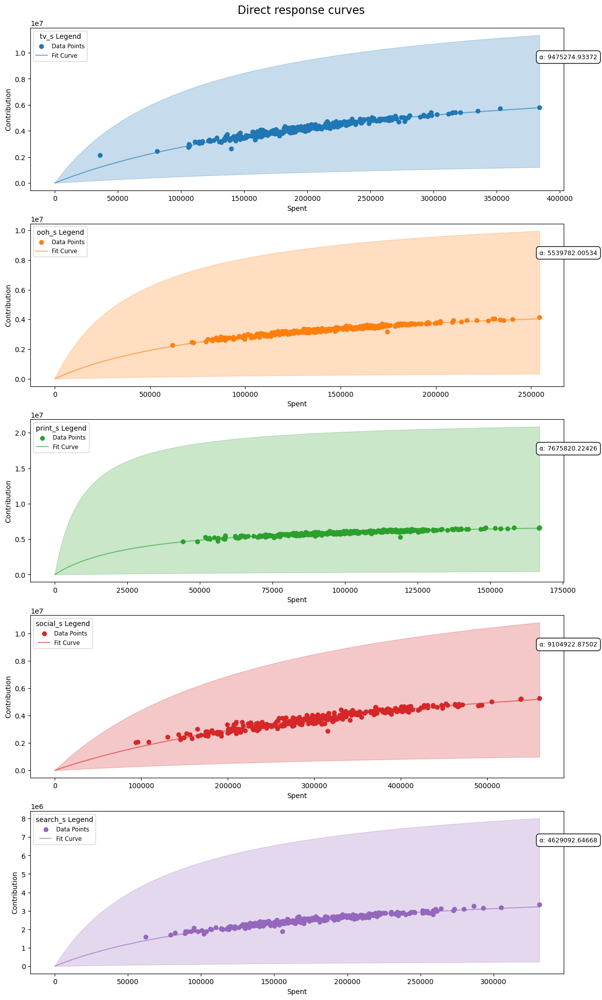

In [39]:
# Plot Response Curves for each channel, based on Michaelis-Menten method

sigmoid_response_curve_fig = mmm.plot_direct_contribution_curves(
    show_fit = True, method='michaelis-menten'
)

In [40]:
# Calculate each channel's budget response parameters, by both Sigmoid and Michaelis-Menten methods

sigmoid_params = mmm.compute_channel_curve_optimization_parameters_original_scale(method='sigmoid')

menten_params = mmm.compute_channel_curve_optimization_parameters_original_scale(method='michaelis-menten')


In [41]:
# Specify the total budget and the channels

total_budget = mean_spend.sum()

# Define channels for optimization

channels = ['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']

# Set initial division of budget by number of channels

budget_per_channel = total_budget / len(channels)

# Set a starting budget for each channel

initial_budget_dict = {channel: budget_per_channel for channel in channels}

# Define the minimum and maximum budgets allowed per channel

min_budget, max_budget = 0, total_budget

# Create budget bounds for each channel

budget_bounds = {channel: [min_budget, max_budget] for channel in channels}

In [42]:
# Calculate budgets using Sigmoid methods

result_sigmoid = mmm.optimize_channel_budget_for_maximum_contribution(
    method = 'sigmoid', #define saturation function
    total_budget = mean_spend.sum(),
    parameters = sigmoid_params,
    budget_bounds = budget_bounds
)

result_sigmoid

,estimated_contribution,optimal_budget
tv_s,4.766505e+06,246453.513687
ooh_s,3.421505e+06,149039.085754
print_s,6.079212e+06,108816.900714
social_s,3.593032e+06,272601.656428
search_s,2.393847e+06,154065.828149
total,2.025410e+07,930976.984733


In [127]:
# Calculate budgets using Michaelis-Menten methods

result_menten = mmm.optimize_channel_budget_for_maximum_contribution(
    method = 'michaelis-menten',
    total_budget = total_budget.sum(),
    parameters = menten_params,
    budget_bounds = budget_bounds
)
result_menten

,estimated_contribution,optimal_budget
tv_s,5.000645e+06,274901.703016
ooh_s,3.403972e+06,150834.150377
print_s,6.281900e+06,131426.874321
social_s,3.278505e+06,237728.067685
search_s,2.238485e+06,136086.189334
total,2.020351e+07,930976.984733


In [44]:
# Loop through budgets to find the optimal proportions for the highest profit

budget_list = []
for total_budget in np.linspace(700_000, 2_300_000, 100):
    result_sigmoid = mmm.optimize_channel_budget_for_maximum_contribution(
        method = 'sigmoid',
        total_budget = total_budget,
        parameters = sigmoid_params,
        budget_bounds = {channel: [0, total_budget] for channel in channels}
    )
    budget_list.append(result_sigmoid.tail(1))

# Combine each single row within the loop into a single DataFrame

profit_df = pd.concat(budget_list, ignore_index=True) \
    .assign(channel_profit = lambda x: x['estimated_contribution'] - x['optimal_budget']) 
    
profit_df

,estimated_contribution,optimal_budget,channel_profit
0,1.783411e+07,7.000000e+05,1.713411e+07
1,1.803281e+07,7.161616e+05,1.731665e+07
2,1.822801e+07,7.323232e+05,1.749569e+07
3,1.841706e+07,7.484848e+05,1.766857e+07
4,1.860020e+07,7.646465e+05,1.783556e+07
...,...,...,...
95,2.417338e+07,2.235354e+06,2.193803e+07
96,2.418979e+07,2.251515e+06,2.193828e+07
97,2.418719e+07,2.267677e+06,2.191952e+07
98,2.418799e+07,2.283838e+06,2.190415e+07


,estimated_contribution,optimal_budget,channel_profit
75,2.393876e+07,1.912121e+06,2.202664e+07


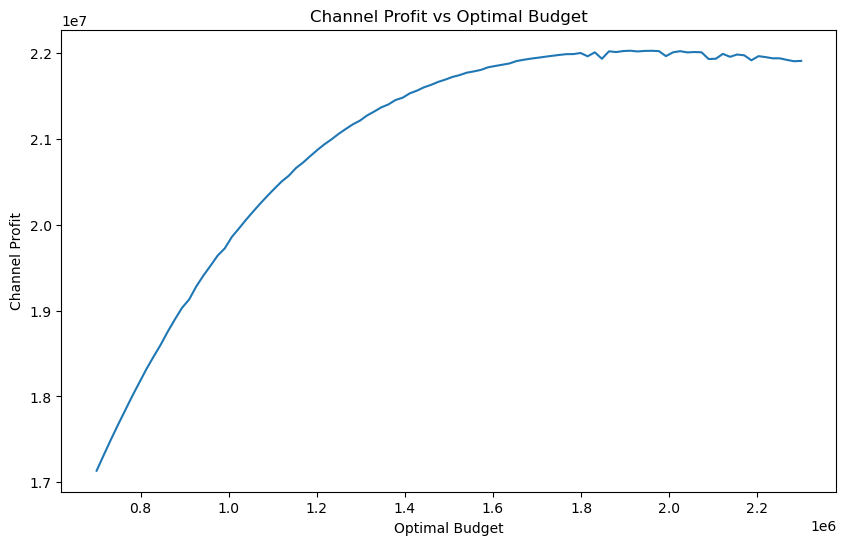

In [45]:
# Visualize the Channel Optimization Results

fig, ax = plt.subplots(figsize=(10, 6))
sns.lineplot(data=profit_df, x="optimal_budget", y="channel_profit", ax=ax)
ax.set(title="Channel Profit vs Optimal Budget", xlabel="Optimal Budget", ylabel="Channel Profit")

# Find the optimal budget

profit_df.query("channel_profit == channel_profit.max()")

In [46]:
# Specify the total budget and the channels

total_budget = mean_spend.sum()

# Define channels for optimization

channels = ['tv_s', 'ooh_s', 'print_s', 'social_s', 'search_s']

# Set initial division of budget by number of channels

budget_per_channel = total_budget / len(channels)

# Set a starting budget for each channel

initial_budget_dict = {channel: budget_per_channel for channel in channels}

# Define spending limits for each channel

min_budget, max_budget = 0, (total_budget / 2)
budget_bounds = {channel: [min_budget, max_budget] for channel in channels}

# Find the single-channel budget that provides the highest profit per channel

optimal_budget = profit_df.loc[profit_df['channel_profit'].idxmax(), 'optimal_budget']
best_budget = float(optimal_budget)


In [47]:
# Optimize the total budget by finding the best split across channels, using the Sigmoid method

result_sigmoid_flat = mmm.optimize_channel_budget_for_maximum_contribution(
    method = 'sigmoid',
    total_budget = total_budget,
    parameters = sigmoid_params,
    budget_bounds = budget_bounds
)

In [48]:
# Format the optimal budget in dollars; show contributions, budget, and profit by channel

optimal_budget = result_sigmoid_flat.assign(profit = lambda x: x['estimated_contribution'] - x['optimal_budget']).apply(lambda x: x.apply(lambda y: "{:,.0f}".format(y)))

optimal_budget

,estimated_contribution,optimal_budget,profit
tv_s,"4,766,505","246,454","4,520,051"
ooh_s,"3,421,505","149,039","3,272,466"
print_s,"6,079,212","108,817","5,970,395"
social_s,"3,593,032","272,602","3,320,430"
search_s,"2,393,847","154,066","2,239,781"
total,"20,254,101","930,977","19,323,124"


In [49]:
# Optimize the optimal (increased) budget by finding the best split across channels, using the Sigmoid method

result_sigmoid_increase = mmm.optimize_channel_budget_for_maximum_contribution(
    method = 'sigmoid', #define saturation function
    total_budget = best_budget,
    parameters = sigmoid_params,
    budget_bounds = budget_bounds
)

In [50]:
# Format the optimal budget in dollars; show contributions, budget, and profit by channel

optimal_budget = result_sigmoid_increase.assign(profit = lambda x: x['estimated_contribution'] - x['optimal_budget']).apply(lambda x: x.apply(lambda y: "{:,.0f}".format(y)))

optimal_budget

,estimated_contribution,optimal_budget,profit
tv_s,"5,615,538","465,488","5,150,050"
ooh_s,"3,900,068","327,923","3,572,144"
print_s,"6,302,901","206,051","6,096,850"
social_s,"4,707,470","465,488","4,241,981"
search_s,"3,104,703","447,170","2,657,533"
total,"23,630,680","1,912,121","21,718,559"


In [51]:
# Prepare the optimization results, with budget remaining the same

flat = (
    result_sigmoid_flat
      .assign(profit_flat=lambda df: df['estimated_contribution'] - df['optimal_budget'])
      .rename(columns={
          'estimated_contribution': 'est_contrib_flat',
          'optimal_budget': 'opt_flat'
      })[['est_contrib_flat','opt_flat','profit_flat']]
)

# Prepare the optimization results, with budget increasing to the optimal spend total
inc = (
    result_sigmoid_increase
      .assign(profit_increase=lambda df: df['estimated_contribution'] - df['optimal_budget'])
      .rename(columns={
          'estimated_contribution': 'est_contrib_inc',
          'optimal_budget': 'opt_inc'
      })[['est_contrib_inc','opt_inc','profit_increase']]
)

In [52]:
# Normalize mean spend into a DataFrame

if isinstance(mean_spend, pd.Series):
    ms_df = mean_spend.rename('mean_spend').to_frame()
else:
    ms_df = mean_spend.rename(columns={mean_spend.columns[0]:'mean_spend'})

In [53]:
# Join mean spend, "flat" results, and "increased" results into one DataFrame

results_df = ms_df.join(flat).join(inc)

# Reset the index as "channel" column

results_df = (
    results_df
      .reset_index()                    
      .rename(columns={'index':'channel'}) 
)

# Split mean revenue evenly across channels

n_channels = len(results_df)
results_df['mean_revenue'] = mean_revenue / n_channels

# Update format into dollars

results_df_formatted = results_df.copy()
for col in results_df_formatted.columns.drop('channel'):
    results_df_formatted[col] = results_df_formatted[col].apply(lambda x: f"${x:,.0f}")

In [54]:
# Compute ROAS for "flat" contribrutions and budgets

results_df['roas_flat'] = results_df['est_contrib_flat'] / results_df['opt_flat']

# Compute revenue at current spend using the "flat" ROAS

results_df['mean_revenue'] = results_df['roas_flat'] * results_df['mean_spend']

# calculate profit for mean spend

results_df['profit_mean'] = results_df['mean_revenue'] - results_df['mean_spend']

# Print results

print(results_df)

    channel     mean_spend  est_contrib_flat       opt_flat   profit_flat  \
0      tv_s  202076.092300      4.766505e+06  246453.513687  4.520051e+06   
1     ooh_s  146300.546900      3.421505e+06  149039.085754  3.272466e+06   
2   print_s  100536.913567      6.079212e+06  108816.900714  5.970395e+06   
3  social_s  302202.337833      3.593032e+06  272601.656428  3.320430e+06   
4  search_s  179861.094133      2.393847e+06  154065.828149  2.239781e+06   

   est_contrib_inc        opt_inc  profit_increase  mean_revenue  roas_flat  \
0     5.615538e+06  465488.492367     5.150050e+06  3.908229e+06  19.340381   
1     3.900068e+06  327923.191375     3.572144e+06  3.358636e+06  22.957100   
2     6.302901e+06  206051.114627     6.096850e+06  5.616639e+06  55.866432   
3     4.707470e+06  465488.492367     4.241981e+06  3.983184e+06  13.180520   
4     3.104703e+06  447169.921385     2.657533e+06  2.794649e+06  15.537818   

    profit_mean  
0  3.706153e+06  
1  3.212336e+06  
2  5.516

In [102]:
# Calculate each channel's share of the current budget

mean_pct = results_df['mean_spend'] / results_df['mean_spend'].sum() * 100

# Calculate each channel's share of the "flat" and optimized budget

opt_pct  = results_df['opt_flat'] / results_df['opt_flat'].sum() * 100

# Calculate each channel's chare of the "increased" and optimized budget

inc_pct = results_df['opt_inc'] / results_df['opt_inc'].sum() * 100

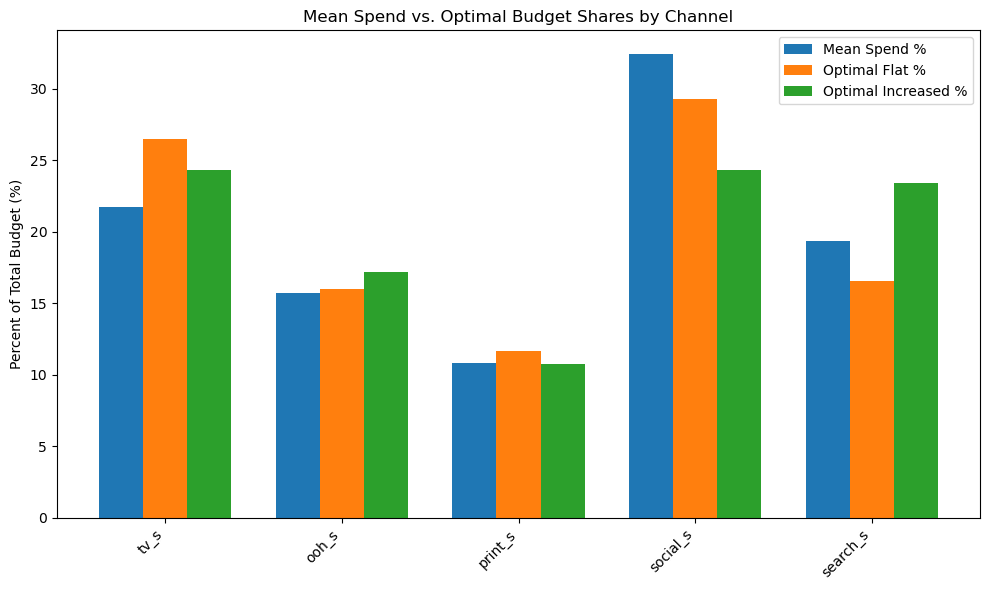

In [139]:
# Prepare for side-by-side bars in clustered bar chart
channels = results_df['channel']
x = np.arange(len(channels))
width = 0.25

# Create a clustered bar chart, comparing mean spend and optimized "flat" total spend by channel

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width, mean_pct, width, label='Mean Spend %')
ax.bar(x, opt_pct,  width, label='Optimal Flat %')
ax.bar(x + width, inc_pct, width, label='Optimal Increased %')

ax.set_xticks(x)
ax.set_xticklabels(channels, rotation=45, ha='right')
ax.set_ylabel('Percent of Total Budget (%)')
ax.set_title('Mean Spend vs. Optimal Budget Shares by Channel')
ax.legend()
plt.tight_layout()
plt.show()

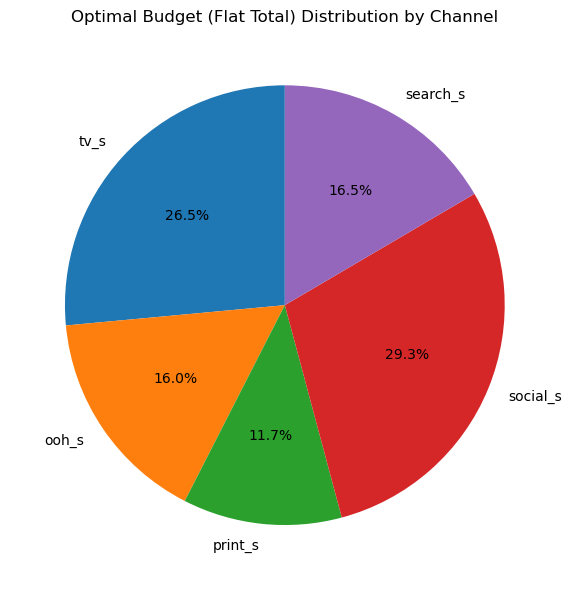

In [57]:
# Create a pie chart to show distribution by channel for the optimized budgets

plt.figure(figsize=(6, 6))
plt.pie(
    results_df['opt_flat'],
    labels=results_df['channel'],
    autopct='%1.1f%%',
    startangle=90
)
plt.title('Optimal Budget (Flat Total) Distribution by Channel')
plt.tight_layout()
plt.show()

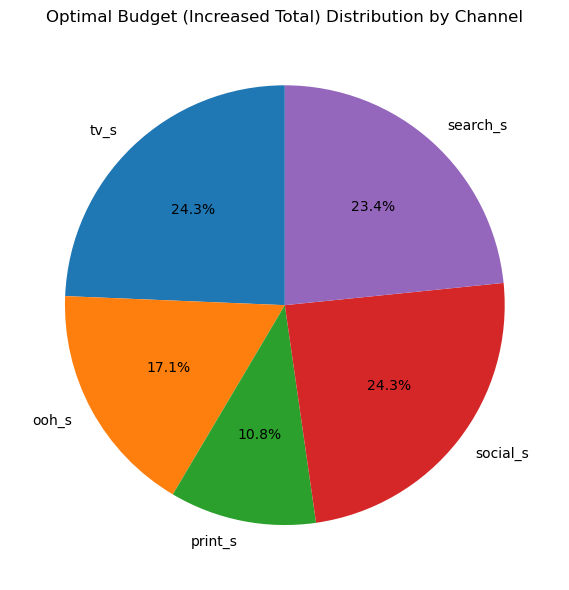

In [100]:
# Create a pie chart to show distribution by channel for the maximized budgets

plt.figure(figsize=(6, 6))
plt.pie(
    results_df['opt_inc'],
    labels=results_df['channel'],
    autopct='%1.1f%%',
    startangle=90
)
plt.title('Optimal Budget (Increased Total) Distribution by Channel')
plt.tight_layout()
plt.show()

In [58]:
# Calculate the profit difference between the optimized "flat" budget and the original budget

opt_delta_profit = sum(results_df['profit_flat']) - sum(results_df['profit_mean'])

# Calculate the budget difference and profit difference between the optimized "flat" budget and the optimized "optimal" budget

inc_delta_spend = sum(results_df['opt_inc']) - sum(results_df['opt_flat'])
inc_delta_profit = sum(results_df['profit_increase']) - sum(results_df['profit_flat'])

# Print the results of the three calculations

print("Profit from optimized budget:  ", f"${opt_delta_profit:,.0f}")
print("Additional spend for increased budget:  ", f"${inc_delta_spend:,.0f}")
print("Profit from increased budget:  ", f"${inc_delta_profit:,.0f}")

Profit from optimized budget:   $592,764
Additional spend for increased budget:   $981,144
Profit from increased budget:   $2,395,435


# 6. Summary and Next Steps

### Results

In [81]:
opt_flat = sum(results_df['opt_flat'])

# Calculate the profit difference between the optimized "flat" budget and the original budget

opt_delta_profit = sum(results_df['profit_flat']) - sum(results_df['profit_mean'])

# Calculate the budget difference and profit difference between the optimized "flat" budget and the optimized "optimal" budget

inc_delta_spend = sum(results_df['opt_inc']) - sum(results_df['opt_flat'])
inc_delta_profit = sum(results_df['profit_increase']) - sum(results_df['profit_flat'])

# Calculate the ROAS for the optimized "flat" budget and the optimized "optimal" budget

opt_roas = (sum(results_df['profit_flat']) + opt_flat) / opt_flat
inc_roas = (sum(results_df['profit_increase']) + sum(results_df['opt_inc'])) / sum(results_df['opt_inc'])

# Print the results of the calculations
print("Original budget:  " f"${opt_flat:,.0f}")
print("Profit from optimized budget:  ", f"${opt_delta_profit:,.0f}")
print("Additional spend for increased budget:  ", f"${inc_delta_spend:,.0f}")
print("Profit from increased budget:  ", f"${inc_delta_profit:,.0f}")

print("Original budget ROAS: ", opt_roas)
print("Increased budget ROAS: ", inc_roas)

Original budget:  $930,977
Profit from optimized budget:   $592,764
Additional spend for increased budget:   $981,144
Profit from increased budget:   $2,395,435
Original budget ROAS:  21.755747848988367
Increased budget ROAS:  12.358358836073162


With the original budget of 930,977 dollars and optimizing allocation, the additional profit is 592,764 dollars, bringing total profit to 19,323,124 dollars (ROAS: 21.76). 

Optimizing the budget to the maximum return would increase the budget by 981,144 dollars to 1,912,121. This would result in an additional profit of 2,395,435 dollars, resulting in total profit of 21,718,559 (ROAS: 12.36).

### Next Steps

There are various opportunities for further utilizing these findings, optimizing strategies, and enhancing promotional capabilities. A few of these may include:

- Fine-tune regional or 360-degree campaigns based on local market media costs and seasonality.
- Build segment-specific MMMs for high value customer cohorts or product categories to find differentiated responses, tailoring spend accordingly.
- Integrate offline promotional activities by adding event dummies for in-store sales, pop-up events, and traditional promotions.
- Develop op an interactive dashboard that allows adjustments by stakeholders, showing the profit and ROAS impact through budget and channel proportion modificatin.
